- This notebook generates the figures related to Striosome analysis: Figure 6

In [1]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
from tqdm import tqdm
import anndata
import pandas as pd

- Load the adata

In [ ]:
%%time

# load 1311 posterior 
Donor_1311_posterior_adata  = anndata.read_h5ad(r'./../../MERFISH_adata_QC/mapmycell_annotated_adata/MER2_Gpe_Gpi_CaPu_1311__MERFISH_annotated.h5ad')
spatialModuleAnnotation = pd.read_csv(r'./../../spatialDomain_analysis/processed_data/donor_1311_PosteriorMERFISH/GroupLevelspatialModule_MatrixStriosome_included_cleaned_final.csv', index_col=0)
Donor_1311_posterior_adata.obs = Donor_1311_posterior_adata.obs.join(spatialModuleAnnotation[['Final_Major_region_label','MatrixStriosome_label']])


print('load 1311 posterior .....')


# # load 2427 posterior 
Donor_2427_posterior_adata = anndata.read_h5ad(r'./../../MERFISH_adata_QC/mapmycell_annotated_adata/MER4_Gpe_Gpi_2724__MERFISH_annotated.h5ad')
spatialModuleAnnotation = pd.read_csv(r'./../../spatialDomain_analysis/processed_data/donor_2724_PosteriorMERFISH/GroupLevelspatialModule_MatrixStriosome_included_cleaned_final.csv', index_col=0)
Donor_2427_posterior_adata.obs = Donor_2427_posterior_adata.obs.join(spatialModuleAnnotation[['Final_Major_region_label','MatrixStriosome_label']])
print('load 2427 posterior .....')


# # load 2427 anterior 
Donor_2427_anterior_adata = anndata.read_h5ad(r'./../../MERFISH_adata_QC/mapmycell_annotated_adata/MER1_CaPuNAC_2427__MERFISH_annotated.h5ad')
spatialModuleAnnotation = pd.read_csv(r'./../../spatialDomain_analysis/processed_data/chip5_AnteriorMERFISH/GroupLevelspatialModule_MatrixStriosome_included_cleaned_final.csv', index_col=0)
Donor_2427_anterior_adata.obs = Donor_2427_anterior_adata.obs.join(spatialModuleAnnotation[['Final_Major_region_label','MatrixStriosome_label']])
print('load 2427 anterior .....')


# # load 3924 anterior 
Donor_3924_anterior_adata = anndata.read_h5ad(r'./../../MERFISH_adata_QC/mapmycell_annotated_adata/MER5_CaPuNAc_3924__MERFISH_annotated.h5ad')
spatialModuleAnnotation = pd.read_csv(r'./../../spatialDomain_analysis/processed_data/donor_3924_AnteriorMERFISH/GroupLevelspatialModule_MatrixStriosome_included_cleaned_final.csv', index_col=0)
Donor_3924_anterior_adata.obs = Donor_3924_anterior_adata.obs.join(spatialModuleAnnotation[['Final_Major_region_label','MatrixStriosome_label']])
print('load 3924 anterior  .....')

load 1311 posterior .....
load 2427 posterior .....
load 2427 anterior .....
load 3924 anterior  .....
CPU times: user 1min 29s, sys: 17 s, total: 1min 46s
Wall time: 1min 50s


- concatenate the anndata

- Make sure the same order of genes is used in all samples

In [3]:
# make sure the same order of genes is used in all samples  and replace count with raw counts
common_gns = np.array(Donor_2427_posterior_adata.var_names)
Donor_1311_posterior_adata.X = Donor_1311_posterior_adata.layers['X_raw']
Donor_1311_posterior_adata = Donor_1311_posterior_adata[:,common_gns].copy()
Donor_1311_posterior_adata.obsm['X_spatial'] = Donor_1311_posterior_adata.obsm['X_spatial_rotated'] if 'X_spatial_rotated'  in Donor_1311_posterior_adata.obsm else Donor_1311_posterior_adata.obsm['X_spatial']

Donor_2427_posterior_adata.X = Donor_2427_posterior_adata.layers['X_raw']
Donor_2427_posterior_adata = Donor_2427_posterior_adata[:,common_gns].copy()
Donor_2427_posterior_adata.obsm['X_spatial'] = Donor_2427_posterior_adata.obsm['X_spatial_rotated'] if 'X_spatial_rotated'  in Donor_2427_posterior_adata.obsm else Donor_2427_posterior_adata.obsm['X_spatial']

Donor_2427_anterior_adata.X = Donor_2427_anterior_adata.obsm['X_raw']
Donor_2427_anterior_adata = Donor_2427_anterior_adata[:,common_gns].copy()
Donor_2427_anterior_adata.obsm['X_spatial'] = Donor_2427_anterior_adata.obsm['X_spatial_rotated'] if 'X_spatial_rotated'  in Donor_2427_anterior_adata.obsm else Donor_2427_anterior_adata.obsm['X_spatial']

Donor_3924_anterior_adata.X = Donor_3924_anterior_adata.layers['X_raw']
Donor_3924_anterior_adata = Donor_3924_anterior_adata[:,common_gns].copy()
Donor_3924_anterior_adata.obsm['X_spatial'] = Donor_3924_anterior_adata.obsm['X_spatial_rotated'] if 'X_spatial_rotated'  in Donor_3924_anterior_adata.obsm else Donor_3924_anterior_adata.obsm['X_spatial']

In [4]:
# concatenate the data
adata = anndata.concat([Donor_1311_posterior_adata,Donor_2427_posterior_adata,Donor_2427_anterior_adata,Donor_3924_anterior_adata],
                       label = 'samples',
                        keys= ['Donor_1311_posterior','Donor_2724_posterior','Donor_2724_anterior','Donor_3924_anterior'],
                        fill_value=0,
                        join='outer',
                        merge='same' ,
                        index_unique='_' # make the cell index unique
                        ) 

In [5]:
def rotate(spatial_x,deg):
    """
    spatial_X: Nx2 matrix
    deg: rotation degree in radian
    
    """
    deg = np.deg2rad(deg)
    rotation_mat = np.array([[np.cos(deg),-1*np.sin(deg)],
                            [np.sin(deg),np.cos(deg)]])
    return np.matmul(spatial_x,rotation_mat)

- Load the countour for the spatial modules 

In [ ]:
donor_1311_posterior_spatialModuleContours = np.load(r'./../../spatialDomain_analysis/processed_data/donor_1311_PosteriorMERFISH/spatialModule_Contourcoord.npy',allow_pickle = True).item()
donor_1311_posterior_StriosomeContours = np.load(r'./../../spatialDomain_analysis/processed_data/donor_1311_PosteriorMERFISH/Striosome_Contourcoord.npy',allow_pickle = True).item()

donor_2427_posterior_spatialModuleContours = np.load(r'./../../spatialDomain_analysis/processed_data/donor_2724_PosteriorMERFISH/spatialModule_Contourcoord.npy',allow_pickle = True).item()
donor_2427_posterior_StriosomeContours = np.load(r'./../../spatialDomain_analysis/processed_data/donor_2724_PosteriorMERFISH/Striosome_Contourcoord.npy',allow_pickle = True).item()

donor_2427_anterior_spatialModuleContours = np.load(r'./../../spatialDomain_analysis/processed_data/chip5_AnteriorMERFISH/spatialModule_Contourcoord.npy',allow_pickle = True).item()
donor_2427_anterior_StriosomeContours = np.load(r'./../../spatialDomain_analysis/processed_data/chip5_AnteriorMERFISH/Striosome_Contourcoord.npy',allow_pickle = True).item()

donor_3924_anterior_spatialModuleContours = np.load(r'./../../spatialDomain_analysis/processed_data/donor_3924_AnteriorMERFISH/spatialModule_Contourcoord.npy',allow_pickle = True).item()
donor_3924_anterior_StriosomeContours = np.load(r'./../../spatialDomain_analysis/processed_data/donor_3924_AnteriorMERFISH/Striosome_Contourcoord.npy',allow_pickle = True).item()

### 1. Spatial map of striosome-matrix compartment

In [8]:
import seaborn as sns
import matplotlib.patches as patches
import os
rot_deg = {'Donor_1311_posterior':0, 'Donor_2724_anterior':-45,'Donor_2724_posterior':0,'Donor_3924_anterior':45} # rotation value for each sample 

adata.obs[['x','y']] = adata.obsm['X_spatial'].copy()
figsize_scale = 8e3

dx_list = []
dy_list = []
samples = np.unique(adata.obs['samples'])
for i,sample in enumerate(samples):
    cond = adata.obs['samples'] == sample
    # adjucent the spatial coordinate 
    X_sample = adata[cond].obsm['X_spatial'].copy()
    X_sample = rotate(X_sample,rot_deg[sample]) # since rotation is could change the xy limit, perform rotation to get accurate estiamte

    # idenity the proprotion betwen the width and height of the sample
    dx,dy = np.abs(np.ptp(X_sample, axis = 0))
    dx_list += [dx/figsize_scale]
    dy_list += [dy/figsize_scale]
dx_max = np.max(dx_list)  
dy_max = np.max(dy_list)  
print(f'max-width:{dx_max}, max-height:{dy_max}')

max-width:3.4967735624804646, max-height:4.602798834741115


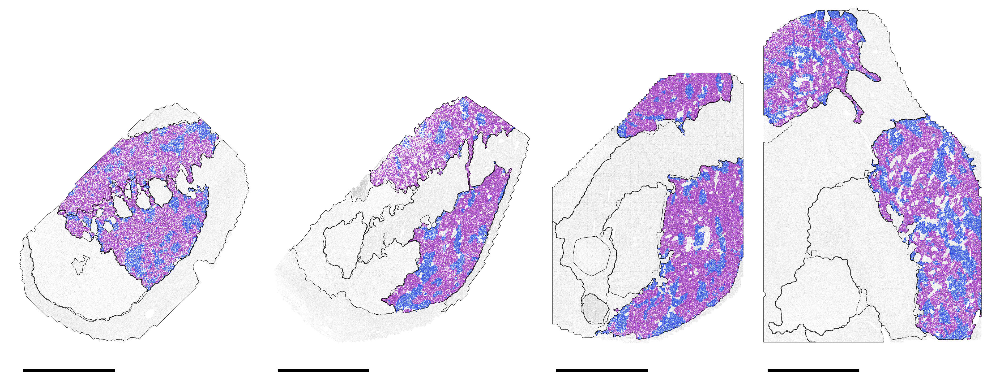

In [73]:
# define canvas for each samples, figure size will be based on the proprotion of the actual tissue size.

# fig,ax = plt.subplots(1,1,dpi = 300, figsize = (15,7))
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import copy 
rot_deg = {'Donor_1311_posterior':0, 'Donor_2724_anterior':-45,'Donor_2724_posterior':0,'Donor_3924_anterior':45} # rotation value for each sample 
reverse_coord = {'Donor_1311_posterior':False,'Donor_2724_anterior':True, 'Donor_2724_posterior':False,'Donor_3924_anterior':True }
invert_xaxis = {'Donor_1311_posterior':False,'Donor_2724_anterior':True,'Donor_2724_posterior':False,'Donor_3924_anterior':False }
invert_yaxis = {'Donor_1311_posterior':True,'Donor_2724_anterior':True,'Donor_2724_posterior':True,'Donor_3924_anterior':True}
backgd_sz = {'Donor_1311_posterior':0.025,'Donor_2724_anterior':0.05,'Donor_2724_posterior':0.03,'Donor_3924_anterior':0.05}
# spatial module dictionary
sptial_module_dict = {'Donor_1311_posterior':donor_1311_posterior_spatialModuleContours,'Donor_2724_anterior':donor_2427_anterior_spatialModuleContours,'Donor_2724_posterior':donor_2427_posterior_spatialModuleContours,'Donor_3924_anterior':donor_3924_anterior_spatialModuleContours}
Striosome_module_dict = {'Donor_1311_posterior':donor_1311_posterior_StriosomeContours,'Donor_2724_anterior':donor_2427_anterior_StriosomeContours,'Donor_2724_posterior':donor_2427_posterior_StriosomeContours,'Donor_3924_anterior':donor_3924_anterior_StriosomeContours}


fig = plt.figure(dpi = 300, figsize = (dx_max,dy_max))
bbox = fig.get_tightbbox()
ax = None

samples = ['Donor_3924_anterior','Donor_2724_anterior','Donor_2724_posterior','Donor_1311_posterior']
figure_title = 'StriosomeMatrix_spatialplots'
for i,sample in enumerate(samples):
    cond = adata.obs['samples'] == sample
    # adjucent the spatial coordinate 
    X_sample = adata[cond].obsm['X_spatial'].copy()
    X_sample = rotate(X_sample,rot_deg[sample])
    cnt = copy.deepcopy(sptial_module_dict[sample])
    strio_cnt = Striosome_module_dict[sample]['Striosome'].copy()
    
    for label_ in cnt:
        if isinstance(cnt[label_],list):
            for i in range(len(cnt[label_])):
                cnt[label_][i] = rotate(cnt[label_][i],rot_deg[sample])
        else:   
            cnt[label_] = rotate(cnt[label_],rot_deg[sample])
    for idx in range(len(strio_cnt)):
        strio_cnt[idx] = rotate(strio_cnt[idx],rot_deg[sample])

    if reverse_coord[sample]:
        X_sample = X_sample[:,::-1]
        for label_ in cnt:
            if isinstance(cnt[label_],list):
                for i in range(len(cnt[label_])):
                    cnt[label_][i] = cnt[label_][i][:,::-1]
            else:
                cnt[label_] = cnt[label_][:,::-1]
        for idx in range(len(strio_cnt)):
            strio_cnt[idx] = strio_cnt[idx][:,::-1]

    adata.obs.loc[cond,['x','y']] = X_sample.copy()
    # idenity the proprotion betwen the width and height of the sample
    dx,dy = np.abs(np.ptp(X_sample, axis = 0))
    if ax != None:
        bbox = ax.get_position()
    dx = dx/figsize_scale
    dy = dy/figsize_scale
    # calculate fraction of the new x and y size as fraction of the previous axis x and y size. we are doing this because, fig.add_axes accept values as fraction of the figure width and hight, 
    dx_frac = dx/fig.get_figwidth()
    dy_frac = dy/fig.get_figheight()
    width_gap = 1
    # if i < 2:
    #     width_gap = 0.8
    #     point_sz_map[all_clusters_plot[0]] = 1
    #     point_sz_map[all_clusters_plot[1]] = 1
        # point_sz_map[all_clusters_plot[2]] = 1
    # elif i < 3:
    #     width_gap = 0.9

    ax = fig.add_axes([bbox.xmin + width_gap*bbox.width,bbox.ymin,dx_frac, dy_frac], adjustable = 'box')
    sns.scatterplot(x =adata.obs.loc[cond,'x'] , y = adata.obs.loc[cond,'y']  ,ax = ax, s = 0.005, color = 'gray')
    # plot matrix 
    keep_region = adata.obs['MatrixStriosome_label'].isin(['Matrix'])
    sns.scatterplot(x =adata.obs.loc[cond & keep_region,'x'] , y = adata.obs.loc[cond & keep_region,'y']  ,ax = ax, s = 0.1, color ='#911eb4')# '#C49A00')
    # plot the striosome
    keep_region = adata.obs['MatrixStriosome_label'].isin(['Striosome'])
    sns.scatterplot(x =adata.obs.loc[cond & keep_region,'x'] , y = adata.obs.loc[cond & keep_region,'y']  ,ax = ax, s = 0.1, color = '#143cdb')
    
    # sns.scatterplot(x =adata.obs.loc[cond,'x'] , y = adata.obs.loc[cond,'y']  ,ax = ax, s = 0.005, color = 'gray')

    # add the outregion outlines 
    for label_ in ['Caudate','Putamen','NAC_shell','NAC_core','Gpi','Gpe','Internal_Capsule','BNST','anterior_commissure','Thalamus']:
        if label_ in cnt:
            if isinstance(cnt[label_],list):
                for i in range(len(cnt[label_])):
                    ax.plot(cnt[label_][i][:,0],cnt[label_][i][:,1], lw = 0.3, c = 'k')
            else:
                ax.plot(cnt[label_][:,0],cnt[label_][:,1], lw = 0.3, c = 'k')
                
    # add the striosome contour outline
    # for cnt in strio_cnt:
    #     ax.scatter(cnt[:,0],cnt[:,1], s = 0.01, c = 'k')      

    # Set the axis limits 
    xmax, ymax = X_sample.max(axis=0)
    xmin, ymin = X_sample.min(axis=0)
    # ax.set_xlim([xmin,xmax])
    ax.set_ylim([ymin,ymax + 3500])
    # add scale bar
    # add scale bar
    if sample == 'Donor_2724_anterior':
        scalebar = patches.Rectangle([xmax - 500,1*ymax + 3000],-10000,200,color = 'k')
    else:    
        scalebar = patches.Rectangle([xmin + 500,1*ymax + 3000],10000,200,color = 'k')

    ax.add_patch(scalebar)

    if invert_xaxis[sample]:
        ax.invert_xaxis()
    
    if invert_yaxis[sample]:
        ax.invert_yaxis()
    ax.set_axis_off()

    # ax.set_aspect('equal', adjustable ='datalim')
    # if i == 0:
    #     # ax.text(xmin + 0.7*np.ptp(X_sample[:,0]), ymin - 0.2*np.ptp(X_sample[:,1]), f'{cluster_}', fontsize = 25)
    #     ax.text(xmin + 0.2*np.ptp(X_sample[:,0]), ymin - 0.2*np.ptp(X_sample[:,1]), f'{figure_title}', fontsize = 25)

plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')

plt.show()

### 2.  Spatial plot for striosome/matrix  enriched cell types 

In [9]:
def plot_cluster_scdata(scdata,cmap,all_clusters,clusters=[1,2],bg_color = 'gray',bg_pt_size = 5, point_sz_map = None, transpose=1,flipx=1,flipy=1,hue_input = 'leiden' , ax = None,use_seaborn = False,show_title = True):
    """
    plot spatial location of cell cluster using either seaborn or matplotlib
    use seaborn for individual clusters
    use matplotlib scatter function to visualize all clusters
    cmap - dictionary that has color of each cluster  used in umap
    """
    fig = None
    if not ax:
     fig,ax = plt.subplots(figsize=(15, 15),)# facecolor="black")

    
    if use_seaborn:
        x,y,hue = 'x', 'y',hue_input
        sns.scatterplot(x=x, y=y, data=scdata.obs, 
                        s=bg_pt_size, markers=dict(marker_edge_color='none'),
                        rasterized=True,
                        ax=ax,c= bg_color)
    else: # use matplotlib
        x,y = (np.array(scdata.obs[['x', 'y']])*[flipx,flipy])[:,::transpose].T
        ax.scatter(x, y, c=bg_color, s = bg_pt_size, marker='.')
        
    for cluster in clusters:
        clst_idx = all_clusters.index(cluster)
        cluster_ = str(cluster)
        inds = scdata.obs[hue_input] == cluster_
        
        #col = cmap[int(clst_idx) % len(cmap)]
        col = cmap[cluster_] # cmap is dictionary
        point_sz = point_sz_map[cluster_] # point size dictionary
        if use_seaborn:
            sns.scatterplot(x=x, y=y, data=scdata.obs[inds], 
                        s=point_sz, markers=dict(marker_edge_color=col),
                        rasterized=True,
                        ax=ax,c= col)
            if show_title:
                ax.set_title(f'cluster {cluster_}',fontsize = 7, y= 1)
        else:
            x_ = x[inds]
            y_ = y[inds]
            ax.scatter(x_, y_, c=col, s= point_sz, marker='.',label = cluster_)
        
        
    
    # ax.set_xlim([x.min(),x.max()])
    # ax.set_ylim([y.min(),y.max()])
    ax.grid(False)
    ax.axis("off")
    ax.axis("equal")
    if fig:
        ax.legend( loc = 'lower center', ncol = len(clusters)//3,markerscale = 12, title = 'Clusters',facecolor = 'black',
            labelcolor = 'white')
        ax.set_title(np.unique(scdata.obs['sample'])[0])
    else:
        # ax.legend( loc = 'lower center')
        pass
        
    ax.autoscale(enable=True, tight=True)
    
   

In [12]:
cluster_cmap = np.load(r'./cluster_cmap_final_updated_9172025.npy', allow_pickle=True).item()
all_clusters = np.unique(adata.obs['Group_name']).tolist()
clusters_curated = [ 

# +++++++++++++ Oligo +++++++++++++++++++++++
'ImOligo','Oligo OPALIN', 'Oligo PLEKHG1',
'COP',
'OPC',
 
# # glia (Astro-Ependy-Immune)
 'Astrocyte',
  'Ependymal',
  'ImAstro',
 'B cells',
 'BAM',
 'Endo',
'VLMC',
'Pericyte',
 'SMC',

# # # ++++++++++++++++ Gp cells  +++++++++++++++++++
 'GPe MEIS2-SOX6 GABA',
 'GPe SOX6-CTXND1 GABA',
 'GPe-NDB-SI LHX6-LHX8-GBX1 GABA',
 'GPi Core',
 'GPi Shell',
 'GPin-BF Cholinergic GABA',

# # +++++++++++++++++ MSN ++++++++++++++++++++++++++++++++
    'STR D1D2 Hybrid MSN',
    'STRd D2 StrioMat Hybrid MSN',
    'STRv D1 NUDAP MSN',
    'STRd D2 Striosome MSN',
    'STRd D2 Matrix MSN',
    'STRd D1 Striosome MSN',
    'STRd D1 Matrix MSN',
    'STRv D2 MSN',
    'STRv D1 MSN',
    
    

    ]

remaining_clusters  = list(set(all_clusters).difference(clusters_curated))

all_clusters = remaining_clusters + clusters_curated

point_sz_map = { 'Oligo OPALIN': 0.2,
                 'Oligo PLEKHG1': 0.5,
                  'COP':0.5,
                  'ImOligo':0.2,
                  'OPC': 0.5,
                'STR D1D2 Hybrid MSN': 2,
                'STRd D2 StrioMat Hybrid MSN': 2,
                'STRv D1 NUDAP MSN':2,
                 'STRd D2 Striosome MSN':1,
                 'STRd D1 Striosome MSN':1,
                 'STRd D2 Matrix MSN':2,
                 'STRd D1 Matrix MSN':2,
                 'STRv D1 MSN':2,
                 'STRv D2 MSN':2,
                  'GPi Core':4,
                  'GPi Shell':4,
                   'GPe SOX6-CTXND1 GABA':2,
                   'GPe MEIS2-SOX6 GABA':2,
                   'GPe-NDB-SI LHX6-LHX8-GBX1 GABA':2,
                    'GPin-BF Cholinergic GABA':2,
                   
                    # glia (Astro-Ependy-Immune)
                    'Astrocyte':0.2,
                    'Ependymal':0.2,
                    'ImAstro':0.2,
                    'B cells':0.2,
                    'BAM':0.2,
                    'Endo':0.2,
                    'VLMC': 1,
                     'Pericyte': 0.5,
                     'SMC': 1

                    
                 }

point_sz_map.update({clst:3 for clst in remaining_clusters})

A.  Figure for Donor 1311 Posterior sample

In [14]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
plt.style.use('default')

adata_ = adata[adata.obs['samples'].isin(['Donor_1311_posterior'])].copy()

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


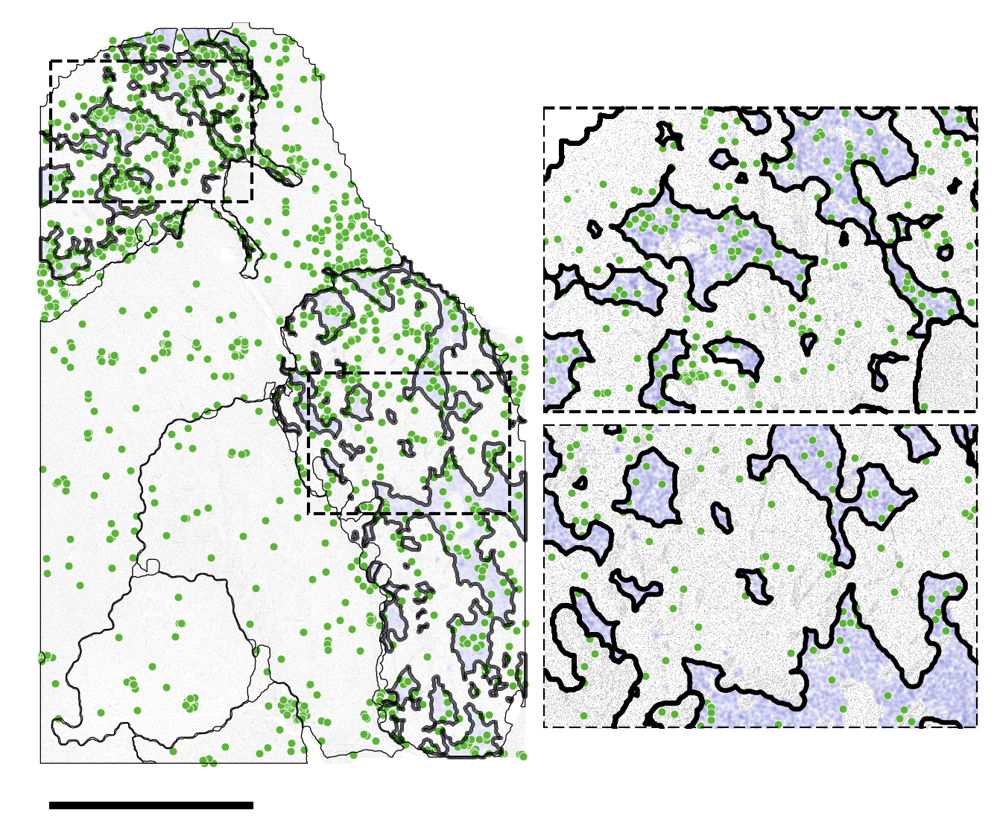

In [24]:
nobox = False
figsize_scale = 8e3
X_sample = adata_.obsm['X_spatial'].copy()
dx,dy = np.abs(np.ptp(X_sample, axis = 0))
dx = dx/figsize_scale
dy = dy/figsize_scale
fig,ax = plt.subplots(1,1,dpi = 300, figsize = (dx, dy))

clusters = list(np.unique(adata_.obs['Group_name']))
# clst =  'STR TAC3-PLPP4 GABA'
clst = 'VIP GABA'
point_sz_map[clst] = 7
# point_sz_map[clst] = 0.1
# clst = 'Astrocyte'

# figure_title = 'Donor_1311p_STR_TAC3_PLPP4_GABA'
figure_title = 'Donor_1311p_VIP_GABA'

plot_cluster_scdata(adata_,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.0025,  point_sz_map = point_sz_map,ax = ax,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax.scatter(adata_[keep].obsm['X_spatial'][:,0],adata_[keep].obsm['X_spatial'][:,1], s = 0.00015, c = 'b', alpha = 0.1,zorder = 0)

# add outline of the spatial modules 
# add the outregion outlines 
cnt = donor_1311_posterior_spatialModuleContours.copy()
for label_ in ['Caudate','Putamen','NAC_shell','NAC_core','Gpi','Gpe','Internal_Capsule','BNST','anterior_commissure','Thalamus']:
    if label_ in cnt:
        if isinstance(cnt[label_],list):
            for i in range(len(cnt[label_])):
                ax.plot(cnt[label_][i][:,0],cnt[label_][i][:,1], lw = 0.3, c = 'k')
        else:
            ax.plot(cnt[label_][:,0],cnt[label_][:,1], lw = 0.3, c = 'k')
            
# add the striosome contour outline
for cnt in donor_1311_posterior_StriosomeContours['Striosome']:
    ax.scatter(cnt[:,0],cnt[:,1], s = 0.001, c = 'k')


# to remove white space set the x and y-lim to max and min values 
xmin, ymin = adata_.obsm['X_spatial'].min(axis=0)
xmax, ymax = adata_.obsm['X_spatial'].max(axis=0)

# add scale bar
scalebar = patches.Rectangle([xmin + 500,1*ymax + 2000],10000,200,color = 'k')
ax.add_patch(scalebar)

ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax + 2500])


# ------------------------------ Zoom in box 1 -----------------------------------------------------------------------------------------------------------------------
# add the rectangle
bbox1 = patches.Rectangle((-12000,-16000),10000,7000, fill = False, lw = 1, ls = '--')
if not nobox:
    ax.add_patch(bbox1)

ax_bbox = ax.get_position()
ax1 = fig.add_axes([ax_bbox.xmax,ax_bbox.ymin +  0.4*ax_bbox.height, 0.84*ax_bbox.height, 0.6*ax_bbox.height  ])


# plot the zoomed in view for 1st box
xmin,ymin, xmax, ymax = np.array(bbox1.get_bbox()).ravel()
cond1 = (adata_.obsm['X_spatial'][:,0] >= xmin) & (adata_.obsm['X_spatial'][:,0] <= xmax)
cond2 = (adata_.obsm['X_spatial'][:,1] >= ymin) & (adata_.obsm['X_spatial'][:,1] <= ymax)

plot_cluster_scdata(adata_[cond1 & cond2],cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.025, point_sz_map = point_sz_map,ax = ax1,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax1.scatter(adata_[cond1& cond2 & keep].obsm['X_spatial'][:,0],adata_[cond1& cond2 & keep].obsm['X_spatial'][:,1], s = 0.005, c = 'b', alpha = 0.1,zorder = 0)

# add outlin ontop of the figures
outline = patches.Rectangle((bbox1.get_bbox().xmin,bbox1.get_bbox().ymin),bbox1.get_bbox().width,bbox1.get_bbox().height, fill = False, lw = 1, ls = '--')
if not nobox:
    ax1.add_patch(outline)

# add the spatial region outline 
for label_ in ['Caudate','Putamen']:
    cnt = donor_1311_posterior_spatialModuleContours[label_].copy()
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    if 'gp' in label_.lower():
        ax1.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k', ls = '--')
    else:
        ax1.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k')

# add the striosome contour outline
for cnt in donor_1311_posterior_StriosomeContours['Striosome']:
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    ax1.scatter(cnt[:,0],cnt[:,1], s = 0.15, c = 'k')


ax1.set_aspect('equal',adjustable='datalim')
ax1.invert_yaxis()


# ------------------------------ Zoom in box 2 -----------------------------------------------------------------------------------------------------------------------

    
bbox2 = patches.Rectangle((800,-500),10000,7000, fill = False, lw = 1, ls = '--')
if not nobox:
    ax.add_patch(bbox2)

ax2 = fig.add_axes([ax_bbox.xmax,ax_bbox.ymin + 0.*ax_bbox.height,0.84*ax_bbox.height, 0.6*ax_bbox.height ])

xmin,ymin, xmax, ymax = np.array(bbox2.get_bbox()).ravel()
cond1 = (adata_.obsm['X_spatial'][:,0] >= xmin) & (adata_.obsm['X_spatial'][:,0] <= xmax)
cond2 = (adata_.obsm['X_spatial'][:,1] >= ymin) & (adata_.obsm['X_spatial'][:,1] <= ymax)

plot_cluster_scdata(adata_[cond1 & cond2],cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.025, point_sz_map = point_sz_map,ax = ax2,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax2.scatter(adata_[cond1& cond2 & keep].obsm['X_spatial'][:,0],adata_[cond1& cond2 & keep].obsm['X_spatial'][:,1], s = 0.005, c = 'b', alpha = 0.1,zorder=0)

# add outlin ontop of the figures
outline = patches.Rectangle((bbox2.get_bbox().xmin,bbox2.get_bbox().ymin),bbox2.get_bbox().width,bbox2.get_bbox().height, fill = False, lw = 1, ls = '--')
if not nobox:
    ax2.add_patch(outline)

# add the spatial region outline 
for label_ in ['Caudate','Putamen']:
    cnt = donor_1311_posterior_spatialModuleContours[label_].copy()
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    if 'gp' in label_.lower():
        ax2.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k', ls = '--')
    else:
        ax2.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k')

# add the striosome contour outline
for cnt in donor_1311_posterior_StriosomeContours['Striosome']:
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    ax2.scatter(cnt[:,0],cnt[:,1], s = 0.15, c = 'k')



ax2.invert_yaxis()
ax2.set_aspect('equal',adjustable='box')

ax.invert_yaxis()
ax.set_aspect('equal',adjustable='datalim')
if not nobox:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')
else:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.tif',bbox_inches = 'tight')

plt.show()

- Zoom-in showing spatial map of Oligo-OPALIN near striosomes

In [17]:
[nm for nm in clusters if 'oligo' in nm.lower()]

['ImOligo', 'Oligo OPALIN', 'Oligo PLEKHG1']

In [19]:
point_sz_map[clst]

0.2

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


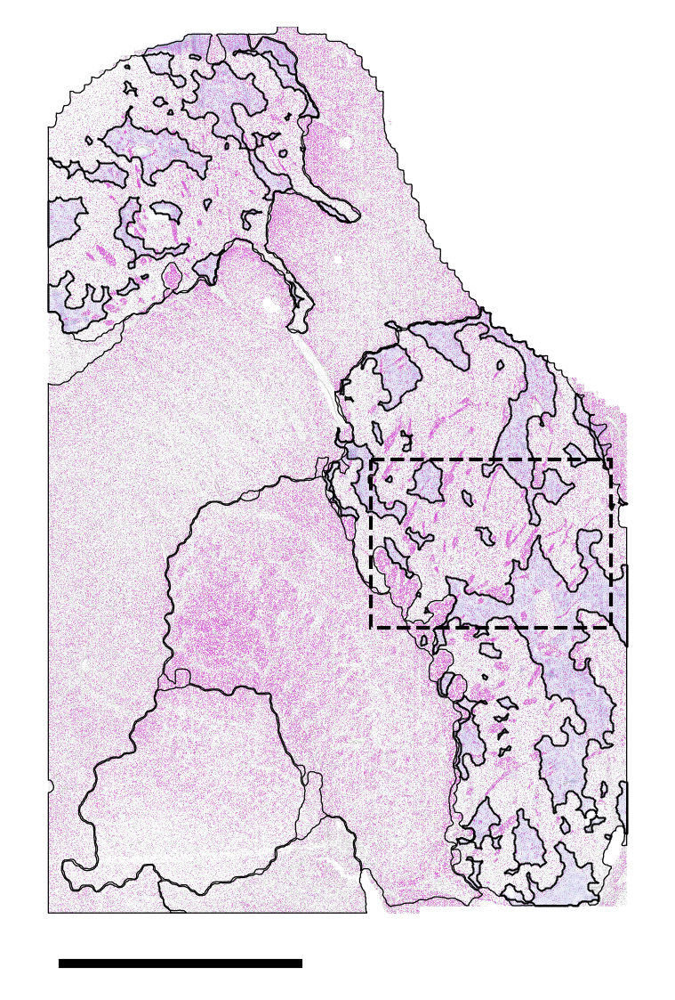

In [ ]:
nobox = False
figsize_scale = 8e3
X_sample = adata_.obsm['X_spatial'].copy()
dx,dy = np.abs(np.ptp(X_sample, axis = 0))
dx = dx/figsize_scale
dy = dy/figsize_scale
fig,ax = plt.subplots(1,1,dpi = 300, figsize = (dx, dy))

clusters = list(np.unique(adata_.obs['Group_name']))
clst =  'Oligo OPALIN'
# clst = 'VIP GABA'
# point_sz_map[clst] = 5
point_sz_map[clst] = 1.5*1e-2
# clst = 'Astrocyte'

figure_title = '1311P_Oligo_OPALIN_Striosome_distribution'
# figure_title = 'Donor_1311p_astrocyte'

plot_cluster_scdata(adata_,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.005,  point_sz_map = point_sz_map,ax = ax,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax.scatter(adata_[keep].obsm['X_spatial'][:,0],adata_[keep].obsm['X_spatial'][:,1], s = 0.00015, c = 'b', alpha = 0.1,zorder = 0)

# add outline of the spatial modules 
# add the outregion outlines 
cnt = donor_1311_posterior_spatialModuleContours.copy()
for label_ in ['Caudate','Putamen','NAC_shell','NAC_core','Gpi','Gpe','Internal_Capsule','BNST','anterior_commissure','Thalamus']:
    if label_ in cnt:
        if isinstance(cnt[label_],list):
            for i in range(len(cnt[label_])):
                ax.plot(cnt[label_][i][:,0],cnt[label_][i][:,1], lw = 0.3, c = 'k')
        else:
            ax.plot(cnt[label_][:,0],cnt[label_][:,1], lw = 0.3, c = 'k')
            
# add the striosome contour outline
for cnt in donor_1311_posterior_StriosomeContours['Striosome']:
    sns.scatterplot(x = cnt[:,0],y = cnt[:,1], s = 0.1, facecolor = 'k', edgecolor = 'k', ax = ax)


# to remove white space set the x and y-lim to max and min values 
xmin, ymin = adata_.obsm['X_spatial'].min(axis=0)
xmax, ymax = adata_.obsm['X_spatial'].max(axis=0)

# add scale bar
scalebar = patches.Rectangle([xmin + 500,1*ymax + 2000],10000,200,color = 'k')
ax.add_patch(scalebar)

ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax + 2500])

# ++++++++++++++++++++++++ add zoomin box ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
bbox2 = patches.Rectangle((900,50),10000,7000, fill = False, lw = 1, ls = '--')
if not nobox:
    ax.add_patch(bbox2)
    

ax.invert_yaxis()
ax.set_aspect('equal',adjustable='datalim')
if not nobox:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')
else:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.tif',bbox_inches = 'tight')

plt.show()

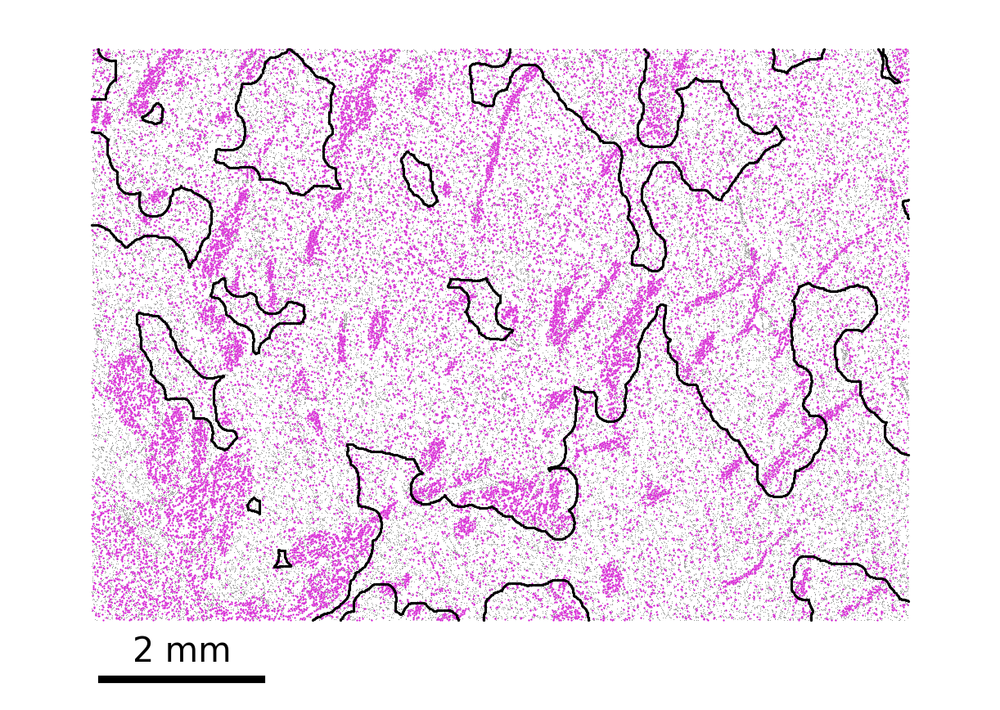

In [38]:
withStriosomeModule = False
figsize_scale = 2e3
xmin,ymin, xmax, ymax = np.array(bbox2.get_bbox()).ravel()
cond1 = (adata_.obsm['X_spatial'][:,0] >= xmin) & (adata_.obsm['X_spatial'][:,0] <= xmax)
cond2 = (adata_.obsm['X_spatial'][:,1] >= ymin) & (adata_.obsm['X_spatial'][:,1] <= ymax)

dx,dy = np.abs(np.ptp(adata_.obsm['X_spatial'][cond1 & cond2], axis = 0))
dx = dx/figsize_scale
dy = dy/figsize_scale
nobox = False

fig,ax = plt.subplots(1,1,dpi = 300, figsize = (dx, dy))

sns.scatterplot(x = adata_[cond1 & cond2].obsm['X_spatial'][:,0],y = adata_[cond1 & cond2].obsm['X_spatial'][:,1], s = 0.07, c = 'gray', ax = ax)

if withStriosomeModule:
    # plot the spatial module 
    keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
    ax.scatter(adata_[keep & cond1 & cond2].obsm['X_spatial'][:,0],adata_[keep & cond1 & cond2].obsm['X_spatial'][:,1], s = 0.015, c = 'b', alpha = 0.1,zorder = 0)

point_sz_map[clst] = 3*1e-1
plot_cluster_scdata(adata_[cond1 & cond2],cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.005,  point_sz_map = point_sz_map,ax = ax,use_seaborn = True,hue_input = 'Group_name',show_title = False)

# add the striosome contour outline
for cnt in donor_1311_posterior_StriosomeContours['Striosome']:
    strio_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    strio_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    sns.scatterplot(x = cnt[strio_cond1 & strio_cond2,0],y = cnt[strio_cond1 & strio_cond2,1], s = 0.5, facecolor = 'k',edgecolor = 'k', ax = ax)      



# add scalebar 
xmin,ymin = np.min(adata_[cond1 & cond2].obsm['X_spatial'],axis = 0)
xmax,ymax = np.max(adata_[cond1 & cond2].obsm['X_spatial'],axis = 0)
import matplotlib.patches as patches
scalebar = patches.Rectangle([xmin + 100, ymax + 700],2000,50, color = 'k')
ax.add_patch(scalebar)
ax.text(xmin + 500, ymax + 500, '2 mm')

ax.set_ylim([ymin - 300,ymax + 800])
ax.invert_yaxis()
ax.set_axis_off()
ax.set_aspect('equal',adjustable='datalim')
figure_title = '1311P_Striosome_OligoOPALIN_zoominView'
if withStriosomeModule:
    figure_title = figure_title + '_withStriosomeModule'
plt.savefig(r'/mnt/Z/Lab/Bereket_public/Human_basal_ganglion_project/FigureMaking_notebooks/figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
plt.savefig(r'/mnt/Z/Lab/Bereket_public/Human_basal_ganglion_project/FigureMaking_notebooks/figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')





B. Figure for Donor 2724 Posterior sample

In [25]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
plt.style.use('default')

adata_ = adata[adata.obs['samples'].isin(['Donor_2724_posterior'])].copy()

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


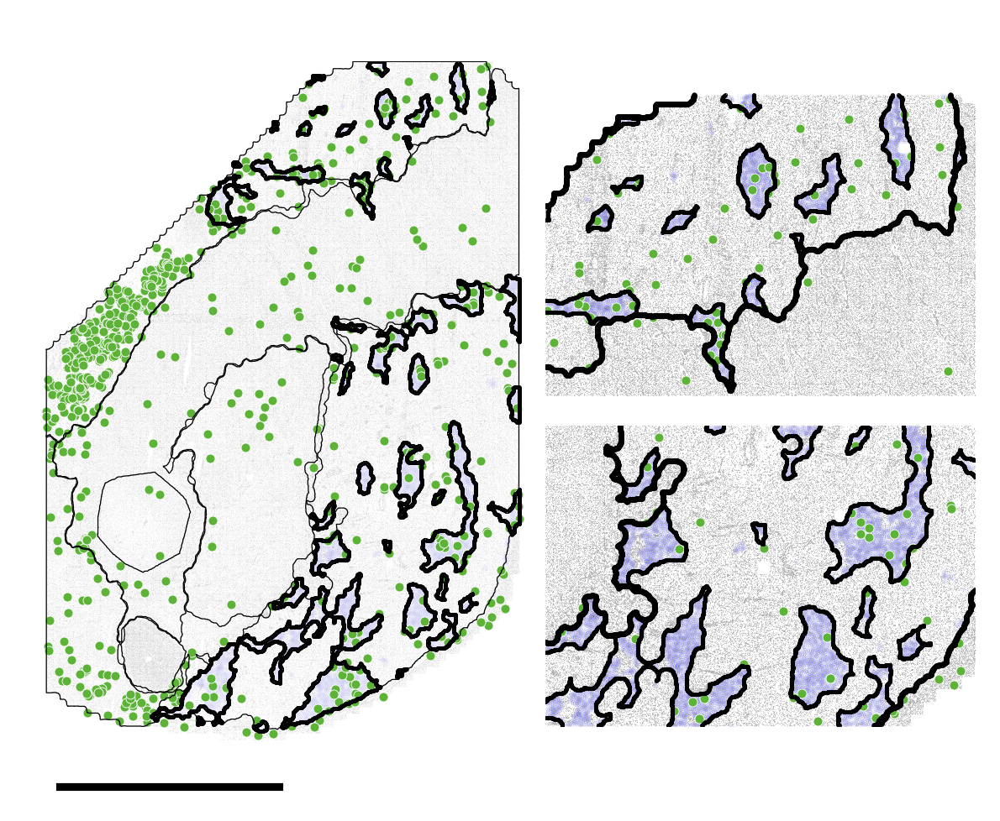

In [29]:
figsize_scale = 8e3
X_sample = adata_.obsm['X_spatial'].copy()
dx,dy = np.abs(np.ptp(X_sample, axis = 0))
dx = dx/figsize_scale
dy = dy/figsize_scale
nobox = True

fig,ax = plt.subplots(1,1,dpi = 300, figsize = (dx, dy))

clusters = list(np.unique(adata_.obs['Group_name']))
# clst =  'STR TAC3-PLPP4 GABA'
# point_sz_map[clst] = 5
clst =  'VIP GABA'
point_sz_map[clst] = 7



figure_title = 'VIP_GABA_2724p'
plot_cluster_scdata(adata_,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.0025, point_sz_map = point_sz_map,ax = ax,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax.scatter(adata_[keep].obsm['X_spatial'][:,0],adata_[keep].obsm['X_spatial'][:,1], s = 0.0001, c = 'b', alpha = 0.1,zorder = 0)

# add outline of the spatial modules 
cnt = donor_2427_posterior_spatialModuleContours.copy()
for label_ in ['Caudate','Putamen','NAC_shell','NAC_core','Gpi','Gpe','Internal_Capsule','BNST','anterior_commissure','Thalamus']:
    if label_ in cnt:
        if isinstance(cnt[label_],list):
            for i in range(len(cnt[label_])):
                ax.plot(cnt[label_][i][:,0],cnt[label_][i][:,1], lw = 0.3, c = 'k')
        else:
            ax.plot(cnt[label_][:,0],cnt[label_][:,1], lw = 0.3, c = 'k')
    
# add the striosome contour outline
for cnt in donor_2427_posterior_StriosomeContours['Striosome']:
    ax.scatter(cnt[:,0],cnt[:,1], s = 0.01, c = 'k')

# to remove white space set the x and y-lim to max and min values 
xmin, ymin = adata_.obsm['X_spatial'].min(axis=0)
xmax, ymax = adata_.obsm['X_spatial'].max(axis=0)


# add scale bar 
xmax, ymax = X_sample.max(axis=0)
xmin, ymin = X_sample.min(axis=0)
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax + 2500])
# add scale bar
scalebar = patches.Rectangle([xmin + 500,1*ymax + 2000],10000,200,color = 'k')
ax.add_patch(scalebar)

# ------------------------------ Zoom in box 1 -----------------------------------------------------------------------------------------------------------------------
# add the rectangle
bbox1 = patches.Rectangle((-500,-17000),10000,7000, fill = False, lw = 1,ls = '--')
if not nobox:
    ax.add_patch(bbox1)

ax_bbox = ax.get_position()
ax1 = fig.add_axes([ax_bbox.xmax + 0.01 * ax_bbox.width,ax_bbox.ymin +  0.45*ax_bbox.height, 0.84*ax_bbox.height, 0.6*ax_bbox.height  ])


# plot the zoomed in view for 1st box
xmin,ymin, xmax, ymax = np.array(bbox1.get_bbox()).ravel()
cond1 = (adata_.obsm['X_spatial'][:,0] >= xmin) & (adata_.obsm['X_spatial'][:,0] <= xmax)
cond2 = (adata_.obsm['X_spatial'][:,1] >= ymin) & (adata_.obsm['X_spatial'][:,1] <= ymax)

plot_cluster_scdata(adata_[cond1 & cond2],cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.025,point_sz_map = point_sz_map,ax = ax1,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax1.scatter(adata_[cond1& cond2 & keep].obsm['X_spatial'][:,0],adata_[cond1& cond2 & keep].obsm['X_spatial'][:,1], s = 0.005, c = 'b', alpha = 0.1,zorder = 0)

# add outlin ontop of the figures
outline = patches.Rectangle((bbox1.get_bbox().xmin,bbox1.get_bbox().ymin),bbox1.get_bbox().width,bbox1.get_bbox().height, fill = False, lw = 1, ls = '--')
if not nobox:
    ax1.add_patch(outline)

# add the spatial region outline 
for label_ in ['Caudate','Putamen','Gpe','Gpi']:
    cnt = donor_2427_posterior_spatialModuleContours[label_].copy()
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    if 'gp' in label_.lower():
        ax1.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k')
    else:
        ax1.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k')

# add the striosome contour outline
for cnt in donor_2427_posterior_StriosomeContours['Striosome']:
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    ax1.scatter(cnt[:,0],cnt[:,1], s = 0.05, c = 'k')


ax1.set_aspect('equal',adjustable='datalim')
ax1.invert_yaxis()


# ------------------------------ Zoom in box 2 -----------------------------------------------------------------------------------------------------------------------


        
bbox2 = patches.Rectangle((-500,2000),10000,7000, fill = False, lw = 1, ls = '--')
if not nobox:
    ax.add_patch(bbox2)

ax2 = fig.add_axes([ax_bbox.xmax + 0.01 * ax_bbox.width,ax_bbox.ymin + 0.*ax_bbox.height,0.84*ax_bbox.height, 0.6*ax_bbox.height ])


xmin,ymin, xmax, ymax = np.array(bbox2.get_bbox()).ravel()
cond1 = (adata_.obsm['X_spatial'][:,0] >= xmin) & (adata_.obsm['X_spatial'][:,0] <= xmax)
cond2 = (adata_.obsm['X_spatial'][:,1] >= ymin) & (adata_.obsm['X_spatial'][:,1] <= ymax)

plot_cluster_scdata(adata_[cond1 & cond2],cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.025,point_sz_map = point_sz_map,ax = ax2,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax2.scatter(adata_[cond1& cond2 & keep].obsm['X_spatial'][:,0],adata_[cond1& cond2 & keep].obsm['X_spatial'][:,1], s = 0.005, c = 'b', alpha = 0.1,zorder = 0)

# add outlin ontop of the figures
outline = patches.Rectangle((bbox2.get_bbox().xmin,bbox2.get_bbox().ymin),bbox2.get_bbox().width,bbox2.get_bbox().height, fill = False, lw = 1, ls = '--')
if not nobox:
    ax2.add_patch(outline)

# add the spatial region outline 
for label_ in ['Caudate','Putamen']:
    cnt = donor_2427_posterior_spatialModuleContours[label_].copy()
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    if 'gp' in label_.lower():
        ax2.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k')
    else:
        ax2.scatter(cnt[:,0],cnt[:,1], s = 0.3, c = 'k')

# add the striosome contour outline
for cnt in donor_2427_posterior_StriosomeContours['Striosome']:
    cnt_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    cnt_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    cnt = cnt[cnt_cond1 & cnt_cond2,:]
    ax2.scatter(cnt[:,0],cnt[:,1], s = 0.05, c = 'k')


ax2.invert_yaxis()
ax2.set_aspect('equal',adjustable='box')

ax.invert_yaxis()
ax.set_aspect('equal',adjustable='datalim')
if not nobox:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')
else:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.tif',bbox_inches = 'tight')

plt.show()

- Zoom-in showing spatial map of Oligo-OPALIN near striosomes

In [40]:
[nm for nm in clusters if 'oligo' in nm.lower()]

['ImOligo', 'Oligo OPALIN', 'Oligo PLEKHG1']

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


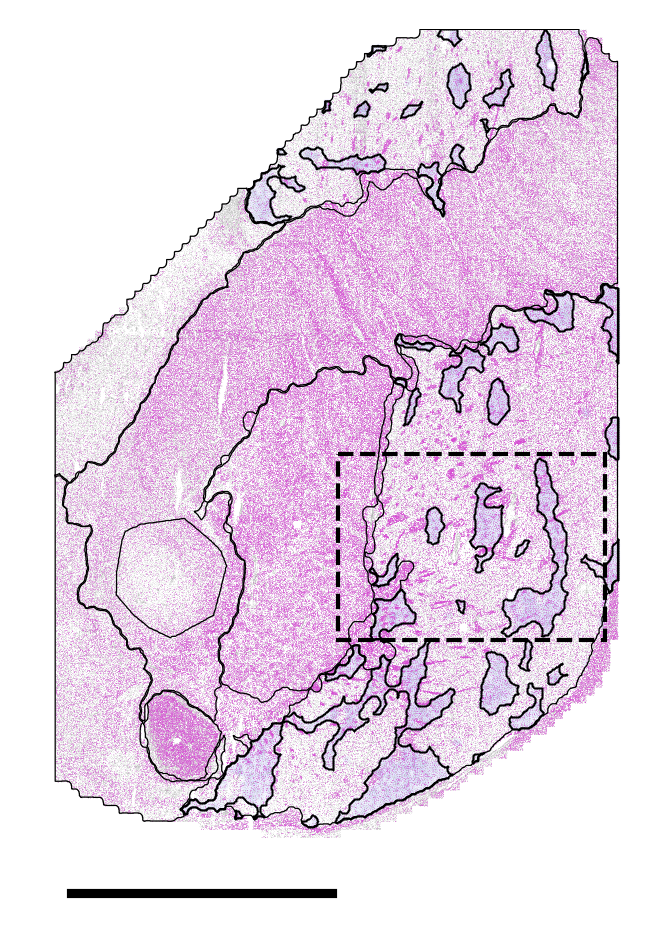

In [47]:
nobox = False
figsize_scale = 8e3
X_sample = adata_.obsm['X_spatial'].copy()
dx,dy = np.abs(np.ptp(X_sample, axis = 0))
dx = dx/figsize_scale
dy = dy/figsize_scale
fig,ax = plt.subplots(1,1,dpi = 300, figsize = (dx, dy))

clusters = list(np.unique(adata_.obs['Group_name']))
clst =  'Oligo OPALIN'
# clst = 'VIP GABA'
# point_sz_map[clst] = 5
point_sz_map[clst] = 1.5*1e-2
# clst = 'Astrocyte'

figure_title = '2724P_Oligo_OPALIN_Striosome_distribution'
# figure_title = 'Donor_1311p_astrocyte'

plot_cluster_scdata(adata_,cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.005,  point_sz_map = point_sz_map,ax = ax,use_seaborn = True,hue_input = 'Group_name',show_title = False)
# plot the spatial module on top
keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
ax.scatter(adata_[keep].obsm['X_spatial'][:,0],adata_[keep].obsm['X_spatial'][:,1], s = 0.00015, c = 'b', alpha = 0.1,zorder = 0)

# add outline of the spatial modules 
# add the outregion outlines 
cnt = donor_2427_posterior_spatialModuleContours.copy()
for label_ in ['Caudate','Putamen','NAC_shell','NAC_core','Gpi','Gpe','Internal_Capsule','BNST','anterior_commissure','Thalamus']:
    if label_ in cnt:
        if isinstance(cnt[label_],list):
            for i in range(len(cnt[label_])):
                ax.plot(cnt[label_][i][:,0],cnt[label_][i][:,1], lw = 0.3, c = 'k')
        else:
            ax.plot(cnt[label_][:,0],cnt[label_][:,1], lw = 0.3, c = 'k')
            
# add the striosome contour outline
for cnt in donor_2427_posterior_StriosomeContours['Striosome']:
    sns.scatterplot(x = cnt[:,0],y = cnt[:,1], s = 0.1, facecolor = 'k', edgecolor = 'k', ax = ax)


# to remove white space set the x and y-lim to max and min values 
xmin, ymin = adata_.obsm['X_spatial'].min(axis=0)
xmax, ymax = adata_.obsm['X_spatial'].max(axis=0)

# add scale bar
scalebar = patches.Rectangle([xmin + 500,1*ymax + 2000],10000,200,color = 'k')
ax.add_patch(scalebar)

ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax + 2500])

# ++++++++++++++++++++++++ add zoomin box ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
bbox2 = patches.Rectangle((-100,-1200),10000,7000, fill = False, lw = 1, ls = '--')
if not nobox:
    ax.add_patch(bbox2)
    

ax.invert_yaxis()
ax.set_aspect('equal',adjustable='datalim')
if not nobox:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')
else:
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.png',bbox_inches = 'tight')
    plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '_nobox.tif',bbox_inches = 'tight')

plt.show()

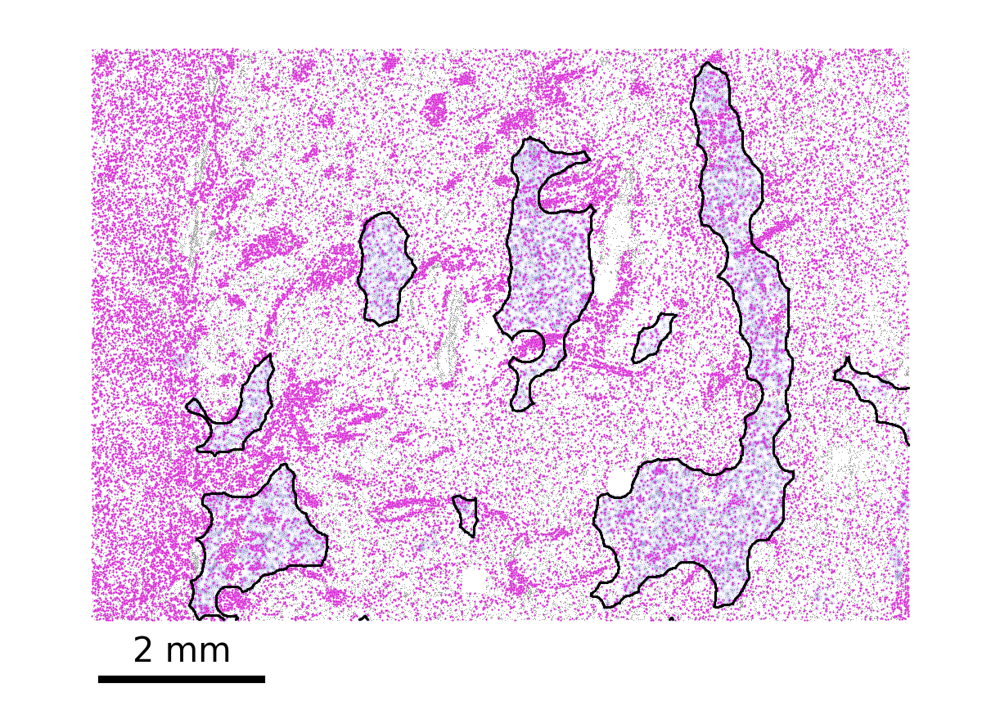

In [ ]:
withStriosomeModule = True
figsize_scale = 2e3
xmin,ymin, xmax, ymax = np.array(bbox2.get_bbox()).ravel()
cond1 = (adata_.obsm['X_spatial'][:,0] >= xmin) & (adata_.obsm['X_spatial'][:,0] <= xmax)
cond2 = (adata_.obsm['X_spatial'][:,1] >= ymin) & (adata_.obsm['X_spatial'][:,1] <= ymax)

dx,dy = np.abs(np.ptp(adata_.obsm['X_spatial'][cond1 & cond2], axis = 0))
dx = dx/figsize_scale
dy = dy/figsize_scale
nobox = False

fig,ax = plt.subplots(1,1,dpi = 300, figsize = (dx, dy))

sns.scatterplot(x = adata_[cond1 & cond2].obsm['X_spatial'][:,0],y = adata_[cond1 & cond2].obsm['X_spatial'][:,1], s = 0.07, c = 'gray', ax = ax)

if withStriosomeModule:
    # plot the spatial module 
    keep = adata_.obs['MatrixStriosome_label'] == 'Striosome'
    ax.scatter(adata_[keep & cond1 & cond2].obsm['X_spatial'][:,0],adata_[keep & cond1 & cond2].obsm['X_spatial'][:,1], s = 0.015, c = 'b', alpha = 0.1,zorder = 0)

point_sz_map[clst] = 3*1e-1
plot_cluster_scdata(adata_[cond1 & cond2],cluster_cmap,clusters,clusters=[clst],bg_pt_size = 0.005,  point_sz_map = point_sz_map,ax = ax,use_seaborn = True,hue_input = 'Group_name',show_title = False)

# add the striosome contour outline
for cnt in donor_2427_posterior_StriosomeContours['Striosome']:
    strio_cond1 = (cnt[:,0] >= xmin) & (cnt[:,0] <= xmax)
    strio_cond2 = (cnt[:,1] >= ymin) & (cnt[:,1] <= ymax)
    sns.scatterplot(x = cnt[strio_cond1 & strio_cond2,0],y = cnt[strio_cond1 & strio_cond2,1], s = 0.5, facecolor = 'k',edgecolor = 'k', ax = ax)      



# add scalebar 
xmin,ymin = np.min(adata_[cond1 & cond2].obsm['X_spatial'],axis = 0)
xmax,ymax = np.max(adata_[cond1 & cond2].obsm['X_spatial'],axis = 0)
import matplotlib.patches as patches
scalebar = patches.Rectangle([xmin + 100, ymax + 700],2000,50, color = 'k')
ax.add_patch(scalebar)
ax.text(xmin + 500, ymax + 500, '2 mm')

ax.set_ylim([ymin - 300,ymax + 800])
ax.invert_yaxis()
ax.set_axis_off()
ax.set_aspect('equal',adjustable='datalim')
figure_title = '2427P_Striosome_OligoOPALIN_zoominView'
if withStriosomeModule:
    figure_title = figure_title + '_withStriosomeModule'
plt.savefig(r'./../../figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
plt.savefig(r'./../../figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')





### 3.  Heatmap showing the distance of cells from the striosome Boarder

In [10]:
# subset to posterior sections.
adata_ = adata[adata.obs['samples'].isin(['Donor_2724_posterior','Donor_1311_posterior'])].copy()
adata_

AnnData object with n_obs × n_vars = 2101925 × 673
    obs: 'volm', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'leiden', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'Final_Major_region_label', 'MatrixStriosome_label', 'samples', 'x', 'y'
    obsm: 'X_raw', 'X_spatial', 'X_spatial_rotated', 'X_umap', 'X_pca'
    layers: 'X_raw'

In [11]:
# compute the distance from striosome boarder 
def getStriosomeCnt_dist(X_spatial, striosome_cnt,StrioMatrix_label):
    import scipy 
    import matplotlib.path as path
    # assign label to the striosome 
    strio_label = np.array([idx for idx,cnt in enumerate(striosome_cnt) for _ in cnt])
    dist,idx = scipy.spatial.KDTree(np.vstack(striosome_cnt)).query(X_spatial)
    cell_striolabel = strio_label[idx]
    # now check the cells that are labeled as striosomal cells are indeed within the striosome contour identified by the KDTree
    is_strio = np.zeros(len(cell_striolabel))
    for cnt_idx in range(len(striosome_cnt)):
        cnt_ROI = path.Path(striosome_cnt[cnt_idx])
        is_strio[cell_striolabel == cnt_idx] = cnt_ROI.contains_points(X_spatial[cell_striolabel == cnt_idx]).astype(int)
    # is_strio = 2*(StrioMatrix_label == 'Striosome') - 1
    is_strio = 2*is_strio - 1
    dist = dist * is_strio

    return dist


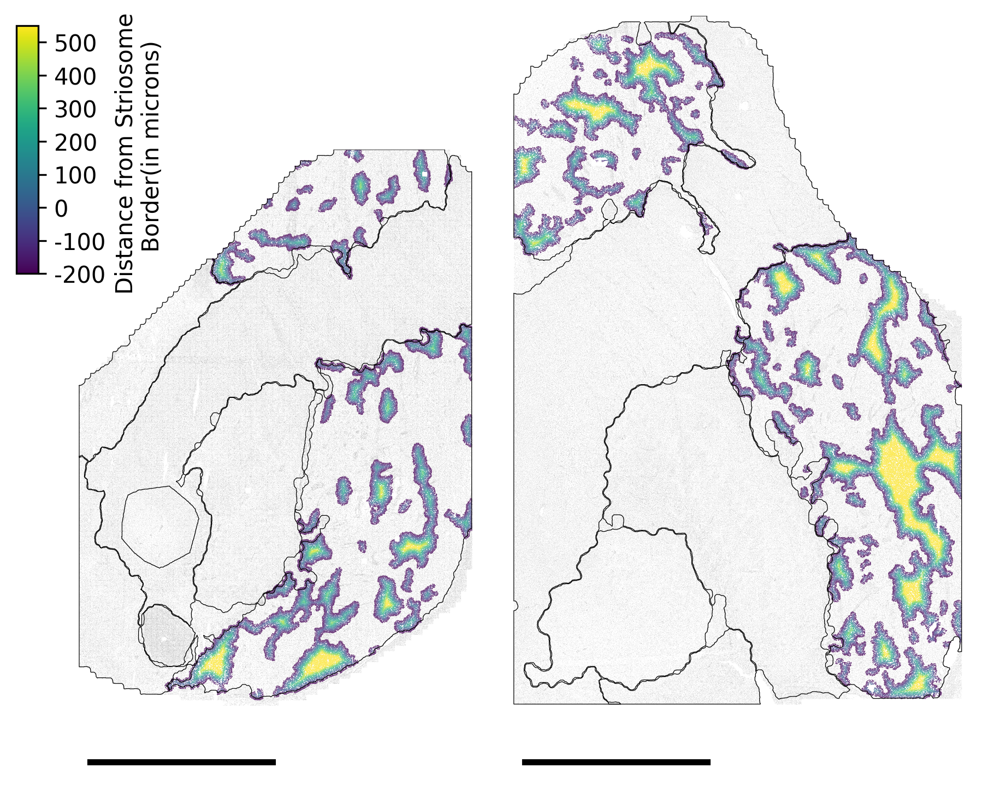

In [14]:
# define canvas for each samples, figure size will be based on the proprotion of the actual tissue size.

# fig,ax = plt.subplots(1,1,dpi = 300, figsize = (15,7))
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib as mpl
import os
import copy 
import cv2
rot_deg = {'Donor_1311_posterior':0, 'Donor_2724_anterior':-45,'Donor_2724_posterior':0,'Donor_3924_anterior':45} # rotation value for each sample 
reverse_coord = {'Donor_1311_posterior':False,'Donor_2724_anterior':True, 'Donor_2724_posterior':False,'Donor_3924_anterior':True }
invert_xaxis = {'Donor_1311_posterior':False,'Donor_2724_anterior':True,'Donor_2724_posterior':False,'Donor_3924_anterior':False }
invert_yaxis = {'Donor_1311_posterior':True,'Donor_2724_anterior':True,'Donor_2724_posterior':True,'Donor_3924_anterior':True}
backgd_sz = {'Donor_1311_posterior':0.025,'Donor_2724_anterior':0.05,'Donor_2724_posterior':0.03,'Donor_3924_anterior':0.05}
# spatial module dictionary
sptial_module_dict = {'Donor_1311_posterior':donor_1311_posterior_spatialModuleContours,'Donor_2724_anterior':donor_2427_anterior_spatialModuleContours,'Donor_2724_posterior':donor_2427_posterior_spatialModuleContours,'Donor_3924_anterior':donor_3924_anterior_spatialModuleContours}
Striosome_module_dict = {'Donor_1311_posterior':donor_1311_posterior_StriosomeContours,'Donor_2724_anterior':donor_2427_anterior_StriosomeContours,'Donor_2724_posterior':donor_2427_posterior_StriosomeContours,'Donor_3924_anterior':donor_3924_anterior_StriosomeContours}


fig = plt.figure(dpi = 300, figsize = (dx_max,dy_max))
bbox = fig.get_tightbbox()
ax = None
nobox = True

samples = ['Donor_2724_posterior','Donor_1311_posterior']
figure_title = 'striosome_distance_heatmap_spatialplots_BrBG_cmap'
for sample_idx,sample in enumerate(samples):
    cond = adata.obs['samples'] == sample
    # adjucent the spatial coordinate 
    X_sample = adata[cond].obsm['X_spatial'].copy()
    X_sample = rotate(X_sample,rot_deg[sample])
    cnt = copy.deepcopy(sptial_module_dict[sample])
    strio_cnt = Striosome_module_dict[sample]['Striosome'].copy()
    
    for label_ in cnt:
        if isinstance(cnt[label_],list):
            for i in range(len(cnt[label_])):
                cnt[label_][i] = rotate(cnt[label_][i],rot_deg[sample])
        else:   
            cnt[label_] = rotate(cnt[label_],rot_deg[sample])
    for idx in range(len(strio_cnt)):
        strio_cnt[idx] = rotate(strio_cnt[idx],rot_deg[sample])

    if reverse_coord[sample]:
        X_sample = X_sample[:,::-1]
        for label_ in cnt:
            if isinstance(cnt[label_],list):
                for i in range(len(cnt[label_])):
                    cnt[label_][i] = cnt[label_][i][:,::-1]
            else:
                cnt[label_] = cnt[label_][:,::-1]
        for idx in range(len(strio_cnt)):
            strio_cnt[idx] = strio_cnt[idx][:,::-1]

    adata.obs.loc[cond,['x','y']] = X_sample.copy()
    # idenity the proprotion betwen the width and height of the sample
    dx,dy = np.abs(np.ptp(X_sample, axis = 0))
    if ax != None:
        bbox = ax.get_position()
    dx = dx/figsize_scale
    dy = dy/figsize_scale
    # calculate fraction of the new x and y size as fraction of the previous axis x and y size. we are doing this because, fig.add_axes accept values as fraction of the figure width and hight, 
    dx_frac = dx/fig.get_figwidth()
    dy_frac = dy/fig.get_figheight()
    width_gap = 1
    # if i < 2:
    #     width_gap = 0.8
    #     point_sz_map[all_clusters_plot[0]] = 1
    #     point_sz_map[all_clusters_plot[1]] = 1
        # point_sz_map[all_clusters_plot[2]] = 1
    # elif i < 3:
    #     width_gap = 0.9

    ax = fig.add_axes([bbox.xmin + width_gap*bbox.width,bbox.ymin,dx_frac, dy_frac], adjustable = 'box')
    sns.scatterplot(x =adata.obs.loc[cond,'x'] , y = adata.obs.loc[cond,'y']  ,ax = ax, s = 0.005, c = 'gray')
    # get distance from striosome 
    # filter some of the striosome based on distance 
    # area_th = np.percentile([cv2.contourArea(cnt) for cnt in strio_cnt],5)
    area_th = np.percentile([len(cnt) for cnt in strio_cnt],5) # use the number of pts used to define the conotur as proxity to estimate it size
    strio_cnt_flt = [cnt for cnt in strio_cnt if len(cnt) > area_th]
    dist = getStriosomeCnt_dist(X_sample, strio_cnt_flt,adata[cond].obs['MatrixStriosome_label'].values)
    dist[dist < -100] = np.nan
    plothandle = sns.scatterplot(x =adata.obs.loc[cond,'x'] , y = adata.obs.loc[cond,'y']  ,ax = ax, s = 0.1, c = dist,cmap = 'viridis' , vmax = 500, vmin = -50)
    
    # add the outregion outlines 
    for label_ in ['Caudate','Putamen','NAC_shell','NAC_core','Gpi','Gpe','Internal_Capsule','BNST','anterior_commissure','Thalamus']:
        if label_ in cnt:
            if isinstance(cnt[label_],list):
                for i in range(len(cnt[label_])):
                    ax.plot(cnt[label_][i][:,0],cnt[label_][i][:,1], lw = 0.3, c = 'k')
            else:
                ax.plot(cnt[label_][:,0],cnt[label_][:,1], lw = 0.3, c = 'k')
                
    # add the striosome contour outline
    # for cnt in strio_cnt:
    #     ax.scatter(cnt[:,0],cnt[:,1], s = 0.01, c = 'k')      

    # add the zoom-in box for each samples
    if sample == 'Donor_1311_posterior':
        bbox2 = patches.Rectangle((900,50),10000,7000, fill = False, lw = 1, ls = '--')
        if not nobox:
            ax.add_patch(bbox2)
    elif sample == 'Donor_2724_posterior':
        bbox2 = patches.Rectangle((-100,-1200),10000,7000, fill = False, lw = 1, ls = '--')
        if not nobox:
            ax.add_patch(bbox2)

    # Set the axis limits 
    xmax, ymax = X_sample.max(axis=0)
    xmin, ymin = X_sample.min(axis=0)
    # ax.set_xlim([xmin,xmax])
    ax.set_ylim([ymin ,ymax + 3500])
    # add scale bar
    scalebar = patches.Rectangle([xmin + 500,1*ymax + 3000],10000,200,color = 'k')
    ax.add_patch(scalebar)

    if invert_xaxis[sample]:
        ax.invert_xaxis()
    
    if invert_yaxis[sample]:
        ax.invert_yaxis()
    ax.set_axis_off()

    # ax.set_aspect('equal', adjustable ='datalim')
    if sample_idx == 0:
        # create axis to add the color bar 
        bbox = ax.get_position()
        cbar_ax = fig.add_axes([bbox.xmin - 0.1*bbox.width,bbox.ymin + 0.8*bbox.height,0.05*bbox.width, 0.4*bbox.height])
        # normalize distance = 
        cmap = mpl.cm.viridis
        # norm = mpl.colors.Normalize(vmin=np.nanmin(dist), vmax=np.nanmax(dist))
        norm = mpl.colors.Normalize(vmin=-200, vmax=550)
        fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),cax = cbar_ax, label = 'Distance from Striosome \n Border(in microns)')
        cbar_ax.set_yticks(np.arange(-200,550,100),np.arange(-200,550,100))

        # ax.text(xmin + 0.7*np.ptp(X_sample[:,0]), ymin - 0.2*np.ptp(X_sample[:,1]), f'{cluster_}', fontsize = 25)
    #     ax.text(xmin + 0.2*np.ptp(X_sample[:,0]), ymin - 0.2*np.ptp(X_sample[:,1]), f'{figure_title}', fontsize = 25)
if not nobox:
    figure_title = figure_title + '_nobox'

plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.png',bbox_inches = 'tight')
plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.tif',bbox_inches = 'tight')
plt.savefig(r'./figures/StriosomeFocus_Figure' + os.sep + figure_title + '.eps',bbox_inches = 'tight')

plt.show()